# Valorant Match Data Study

The data currently is about 2GB of full API data, with match data extracted elsewhere (processed.npz).
Let's begin with the match data.

In our basic study, we're going to be looking at:
- Match play rates
- Agent pick rates across ranks
- How effective of a predictor first kill is for round outcome
- How effective of a predictor first round win is for match outcome

`fulldata.json` contains lots of match data like this.
```
{
    "matchid": "4320354c-1fda-47ae-ad9b-56c1e7a78e24",
    "red": {
        "agents": [
            "Killjoy",
            "Viper",
            "Raze",
            "Brimstone",
            "Jett"
        ],
        "win": true,
        "map": "Bind",
        "avg_rank": 8.2
    },
    "blue": {} // same as red, but for defence team
}
```
Let's process it for our first 2 studies

In [2]:
import json
import numpy as np
import matplotlib.pyplot as plt

with open('./fulldata.json') as f:
    data = json.load(f)

maps_dict = {}
agents_dict = {}

split_data = []
teams = ["red", "blue"]
for match in data:
    for team in teams:
        datapoint = match[team]
        datapoint["attacking"] = (team == "red")
        if datapoint["avg_rank"] is not None and not (np.isnan(datapoint["avg_rank"])):
            # we can process this
            split_data.append(datapoint)
            maps_dict[datapoint["map"]] = True
            for agent in datapoint["agents"]:
                agents_dict[agent] = True

agents = []
maps = []
for agent in agents_dict:
    agents.append(agent)
for map in maps_dict:
    maps.append(map)
maps = sorted(maps)
agents = sorted(agents)

for x in range(len(agents)):
    agents_dict[agents[x]] = x
for x in range(len(maps)):
    maps_dict[maps[x]] = x

print(str(len(split_data)) + " records collected")
print(agents_dict)
print(maps_dict)

datasize = len(split_data)
agentssize = len(agents)
mapssize = len(maps)

x_agents = np.zeros((datasize, agentssize))
x_maps = np.zeros((datasize, mapssize))
x_rank = np.zeros((datasize, ))
x_attacking = np.zeros((datasize, ))

y_winning = np.zeros((datasize, ))

ranks = []
for x in range(datasize):
    data = split_data[x]
    curr_agents = np.zeros((agentssize,))
    for agent in data["agents"]:
        curr_agents[agents_dict[agent]] = 1
    x_agents[x] = curr_agents

    curr_maps = np.zeros((mapssize,))
    curr_maps[maps_dict[data["map"]]] = 1
    x_maps[x] = curr_maps
    x_rank[x] = data["avg_rank"]
    x_attacking[x] = data["attacking"]
    y_winning[x] = data["win"]

np.savez("./processed.npz", x_agents=x_agents, x_maps=x_maps, x_rank=x_rank, x_attacking=x_attacking,y_winning=y_winning)

33450 records collected
{'Killjoy': 5, 'Viper': 13, 'Raze': 8, 'Brimstone': 2, 'Jett': 4, 'Omen': 6, 'Cypher': 3, 'Sage': 10, 'Reyna': 9, 'Yoru': 14, 'Sova': 12, 'Astra': 0, 'Phoenix': 7, 'Skye': 11, 'Breach': 1}
{'Bind': 1, 'Breeze': 2, 'Haven': 3, 'Ascent': 0, 'Split': 5, 'Icebox': 4}


Let's begin by looking at how many matches are played by rank.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


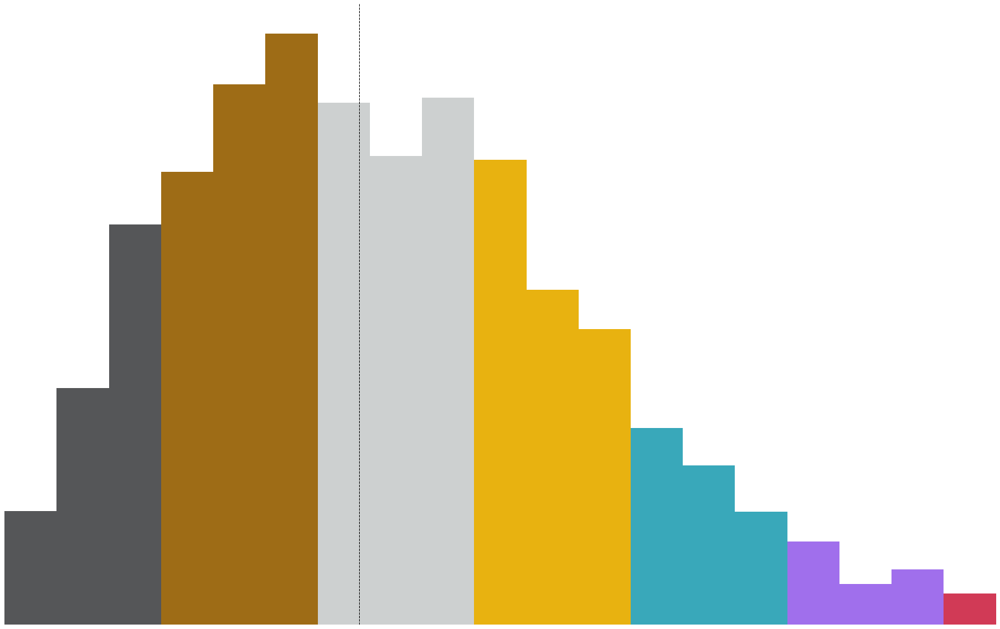

In [3]:
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}
plt.rcParams['text.color'] = 'white'
plt.rc('font', **font)

plt.rcParams["figure.figsize"] = (28,18)
rank_colors = ["#555658", "#9E6C16", "#CDD0D0", "#E8B210", "#39A8BA", "#A06FEC", "#D13A56"]
n, bins, bars = plt.hist(x_rank, range(3, 24 + 1), density=True)
x_max = np.ceil(np.max(x_rank))
plt.xlim(np.floor(np.min(x_rank)), x_max)
for x in range(len(bars)):
    bar = bars[x]
    bar.set_facecolor(rank_colors[int(x / 3)])
rects = bars
# Make some labels.
labels = ["%d%%" % (n[i] * 100) for i in range(len(rects))]

for rect, label in zip(rects, labels):
    if rect.get_x() < x_max:
        height = rect.get_height()
        plt.text(rect.get_x() + rect.get_width() / 2, height, label, ha='center', va='bottom')
plt.axvline(np.median(x_rank), color='k', linestyle='dashed', linewidth=1)
plt.axis('off')
plt.show()
# plt.xlim(np.floor(np.min(x_rank)), np.ceil(np.max(x_rank)) - 11)

# plt.axvline(np.median(x_rank), color='k', linestyle='dashed', linewidth=1)
# plt.axis('on')
# plt.show()
# plt.savefig("rankdistribution", transparent=True)

This is the expected curve for this game.
Interestingly, the dataset contained no all Radiant games - there some Immortal/Radiant games, and these were counted as Immortal games.

Now let's see some pickrate data.

In [4]:
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}
plt.rcParams['text.color'] = 'white'
plt.rc('font', **font)

plt.rcParams["figure.figsize"] = (45,15)

no_ranks = 19
min_rank = 3

colors = {
    "Astra": "#CA34AF",
    "Breach": "#FF824C",
    "Brimstone": "#FF5900",
    "Cypher": "#B8BAB9",
    "Jett": "#75D2E0",
    "Killjoy": "#F8DD30",
    "Omen": "#AAA8F4",
    "Phoenix": "#F6A056",
    "Raze": "#FF5E34",
    "Reyna": "#CE53AF",
    "Sage": "#3BDFC3",
    "Skye": "#7EDDB9",
    "Sova": "#F4DBC1",
    "Viper": "#00C946",
    "Yoru": "#3B80EF"
}

for i in range(3):
    for j in range(5):
        agent_no = (i * 5) + j
        find_pickrate_of = agents[agent_no]
        peek_agent = agents_dict[find_pickrate_of] # Sage
        wins = np.zeros((no_ranks,))
        losses = np.zeros((no_ranks,))
        total = np.zeros((no_ranks,))
        for x in range(datasize):
            curr_rank = int(np.floor(x_rank[x]) - min_rank)
            total[curr_rank] += 1
            if (x_agents[x][peek_agent] == 1):
                if (y_winning[x] == 1):
                    wins[curr_rank] += 1
                else:
                    losses[curr_rank] += 1

        pickrate = (wins + losses) / total
        print(find_pickrate_of + ":" + str(np.average(pickrate)))
        #plt.title.set_text(find_pickrate_of)
        plt.bar(np.arange(no_ranks), pickrate, color=colors[find_pickrate_of])
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(find_pickrate_of + "pickrate.png", transparent=True, color=colors[find_pickrate_of], pad_inches=0)
        plt.clf()

Astra:0.05406092995932884
<ipython-input-4-dde7b3604594>:53: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "color" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(find_pickrate_of + "pickrate.png", transparent=True, color=colors[find_pickrate_of], pad_inches=0)
Breach:0.08903946610828874
Brimstone:0.20413326737613308
Cypher:0.17848852594349265
Jett:0.7114271545867612
Killjoy:0.29710103582687847
Omen:0.37868813622424385
Phoenix:0.2291332936725883
Raze:0.4448494678885132
Reyna:0.6850954898332561
Sage:0.8454367506382986
Skye:0.1626210770223285
Sova:0.36437799598051307
Viper:0.2444483170291829
Yoru:0.11109909191019239


<Figure size 3240x1080 with 0 Axes>

As expected, Sage has the highest playrate across the board by far.
When Skye was added, I expected to see much higher playrate for her as the game's second healer (stronger team healing than Sage), but this was apparently not the case.

**Agents whose playrate increases with rank**
- Astra
- Cypher
- Jett
- Killjoy
- Omen
- Viper

**Agents whose playrate decreases with rank**
- Phoenix
- Raze
- Reyna
- Yoru

Now for kill data, we're going to need to load the full 7GBs worth of match data.
This definitely needs some slimming first: I want the results to be quick.

But first, here's what one match JSON looks like:
```
{
    "metadata": {
        "map": "Icebox",
        "game_version": "release-02.11-shipping-9-567060",
        "game_length": 2306621,
        "game_start": 1623790095292,
        "game_start_patched": "Tuesday, June 15, 2021 4:48 PM",
        "rounds_played": 23,
        "mode": "Competitive",
        "season_id": "52e9749a-429b-7060-99fe-4595426a0cf7",
        "platform": "PC",
        "matchid": "f365a05b-e981-4f52-bc7e-4dc82a34b7b3"
    },
    "players": {
      "all_players": [
        {
          "puuid": "4426a433-a1cb-53fd-968f-a554de14f821",
          "name": "ver bana ilgi",
          "tag": "6161",
          "team": "Blue",
          "character": "Sage",
          "currenttier": 12,
          "currenttier_patched": "Gold 1",
          "player_card": "7d6da166-42fc-63b2-2913-91a1cd89571c",
          "player_title": "21dda67e-46d9-081d-0436-fc93fbb1331d",
          "stats": {
            "score": 3574,
            "kills": 12,
            "deaths": 16,
            "assists": 20
          },
          "ability_casts": {
            "c_cast": 14,
            "q_cast": 15,
            "e_cast": 21,
            "x_cast": 3
          },
          "damage_made": 2631,
          "damage_received": 0
        },
        ...
      ],
      "red": [...],
      "blue: [...]
    },
    "teams": {
      "red": {
        "has_won": false,
        "rounds_won": 10,
        "rounds_lost": 13
      },
      "blue": {
        "has_won": true,
        "rounds_won": 13,
        "rounds_lost": 10
      }
    },
    "rounds": [
      {
        "winning_team": "Red",
        "end_type": "Eliminated",
        "bomb_planted": true,
        "bomb_defused": false,
        "plant_events": {
          "plant_location": {
            "x": -7114,
            "y": 3042
          },
          "planted_by": {
            "display_name": "BFC VISER#1928",
            "team": "Red"
          },
          "plant_side": "B",
          "plant_time_in_round": 32199,
          "player_locations_on_plant": [
            {
              "location": {
                "x": -7789,
                "y": 3486
              },
              "player_puuid": "9fa2cc80-bd17-52b1-82c4-45d34c6cb33a",
              "player_display_name": "HG Haroun#1907",
              "player_team": "Red"
            }, ...
          ]
        },
        "defuse_events": {
          "defused_by": null,
          "defuse_location": null,
          "defuse_time_in_round": null,
          "player_locations_on_defuse": []
        },
        "player_stats": [
          {
            "ability_casts": {
              "c_cast": null,
              "q_cast": null,
              "e_cast": null,
              "y_cast": null
            },
            "player_puuid": "9d2a55c3-eaaf-5caf-a890-cada573d5580",
            "player_display_name": "5GR makei#5GR",
            "player_team": "Red",
            "damage_events": [
              {
                "receiver_puuid": "d2c9dd5b-ba5f-5943-b47c-64e91c72108e",
                "receiver_display_name": "Cotonono#Cot",
                "receiver_team": "Blue",
                "bodyshots": 1,
                "damage": 135,
                "headshots": 1,
                "legshots": 0
              }, ...
            ],
            "damage": 300,
            "bodyshots": 3,
            "headshots": 2,
            "legshots": 0,
            "kill_events": [
              {
                "kill_time_in_round": 19762,
                "kill_time_in_match": 74793,
                "killer_puuid": "9d2a55c3-eaaf-5caf-a890-cada573d5580",
                "killer_display_name": "5GR makei#5GR",
                "killer_team": "Red",
                "victim_puuid": "d2c9dd5b-ba5f-5943-b47c-64e91c72108e",
                "victim_display_name": "Cotonono#Cot",
                "victim_team": "Blue",
                "victim_death_location": {
                  "x": -5556,
                  "y": 3750
                },
                "damage_weapon_id": "1BAA85B4-4C70-1284-64BB-6481DFC3BB4E",
                "secondary_fire_mode": false,
                "player_locations_on_kill": [
                  {
                    "location": {
                      "x": -4991,
                      "y": 3888
                    },
                    "player_puuid": "4426a433-a1cb-53fd-968f-a554de14f821",
                    "player_display_name": "ver bana ilgi#6161",
                    "player_team": "Blue"
                  }, ...
                ],
                "assistants": []
              },
              ...
            ],
            "kills": 3
          }, ...
        ]
      }, ...
    ]
}
          
```

To slim this down, I got rid of all kill_events and put the resulting JSONs in slim_data (slim.js does this)

This cut the dataset size down to 600MB: much more manageable.  
On another note, Riot's results from these APIs are very inefficient: there's a lot of redundant data for next to no performance gain. For example, every single player's data is listed multiple times: once in "all_players", once in their team's players ("red"/"blue"), and then their username continues to be listed across other data, while a player ID would be sufficient. If advanced data on all rounds is given, ...why is there an object showing a count of rounds won?

These small processing tasks should be, in my opinion, offloaded to the users of these APIs.

As such, I could do much more slimming, but this is the low hanging fruit: I can't think of a good use for kill_events (yet).

Before we jump to all of the plant stuff, lets begin with the round predictor study.  
We can't do the first kill one because we got rid of kill_events: whatever.

In [5]:
# ../data/slim_data/x.json

slim_round_win_data = []

from pathlib import Path

pathlist = Path("../data/slim_data").glob('*.json')
total_matches = 0
for path in pathlist:
    # because path is object not string
    pathstr = str(path)
    # read in the data and add the rounds data
    with open(pathstr, 'r', encoding="utf8") as myfile:
        data = json.load(myfile)
        total_matches += len(data)
        for match in data:
            if (match["teams"]["red"] is not None) and (match["teams"]["blue"] is not None) and len(match["rounds"]) != 0:
                red_won = match["teams"]["red"]["has_won"]
                blue_won = match["teams"]["blue"]["has_won"]

                rounds = match["rounds"]
                round_arr = np.zeros((len(rounds),))
                for idx, round_ in enumerate(rounds):
                    winner = round_["winning_team"].lower() == "red"
                    winner = 1 if winner else 0
                    round_arr[idx] = winner
                slim_round_win_data.append((red_won, blue_won, round_arr))

print(len(slim_round_win_data))
print(total_matches)
print(slim_round_win_data[0])

37397
40392
(True, False, array([1., 0., 1., 1., 0., 1., 1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 0.,
       0., 0., 1.]))


In [6]:
agreement = 0
for match in slim_round_win_data:
    red_won, blue_won, rounds = match
    agreeing = red_won if rounds[0] == 1 else blue_won
    if agreeing:
        agreement += 1

print(agreement / len(slim_round_win_data))

0.6193277535631201


I went to compare this with 3kliksphilips video on "Are pistol rounds too important?", but then I realised that Physicqueqes initial data looked at both pistol round wins so...  
On to it!

In [7]:
both_pistol_matches = 0
agreement = 0
for match in slim_round_win_data:
    red_won, blue_won, rounds = match
    if (len(rounds) >= 13):
        if rounds[0] == rounds[12]: # both pistol rounds were won
            both_pistol_matches += 1

            agreeing = red_won if rounds[0] == 1 else blue_won
            if agreeing:
                agreement += 1

print(agreement / both_pistol_matches)

0.7486590038314176


Now that's more directly comparable: and quite interesting!  
Winning both pistol rounds is a win 68% of the time in CSGO, but this jumps up to 75% in VALORANT. You could attribute this to abilities: being able to buy more powerful abilities makes it easier for better teams to snowball.


NOW we can get to some fun stuff with planting

In [8]:
# ../data/slim_data/x.json

round_plant_data = []

from pathlib import Path

rankslist = []
pathlist = Path("../data/slim_data").glob('*.json')
for path in pathlist:
    # because path is object not string
    pathstr = str(path)
    # read in the data and add the rounds data
    with open(pathstr, 'r', encoding="utf8") as myfile:
        data = json.load(myfile)
        for match in data:
            rank_tot = 0
            ranked_players = 0
            for player in match["players"]["all_players"]:
                if (player["currenttier"] != 0):
                    rank_tot += player["currenttier"]
                    ranked_players += 1
            if ranked_players != 0:
                match_rank = rank_tot / ranked_players
                rankslist.append(match_rank)
                for round_ in match["rounds"]:
                    if round_["bomb_planted"]:
                        round_["map"] = match["metadata"]["map"]
                        round_["rank"] = match_rank
                        round_plant_data.append(round_)

rankslist = np.array(rankslist)

print(len(round_plant_data))
print(round_plant_data[0])
print(np.min(rankslist))
print(np.max(rankslist))
print(np.median(rankslist))

352402
{'winning_team': 'Red', 'end_type': 'Eliminated', 'bomb_planted': True, 'bomb_defused': False, 'plant_events': {'plant_location': {'x': 10029, 'y': 1927}, 'planted_by': {'display_name': 'HotGirlBummer#6969', 'team': 'Red'}, 'plant_side': 'A', 'plant_time_in_round': 42842, 'player_locations_on_plant': [{'location': {'x': 11368, 'y': -6983}, 'player_puuid': '73de2e11-dfde-5436-a363-8ba69c309982', 'player_display_name': 'smithy#9552', 'player_team': 'Red'}, {'location': {'x': 8924, 'y': -3537}, 'player_puuid': '09a7fa6c-20fb-50bd-a2cb-386f0b7258f0', 'player_display_name': 'DepressedBagel#2355', 'player_team': 'Blue'}, {'location': {'x': 10029, 'y': 1927}, 'player_puuid': '980c7b25-3d6b-5444-80ed-51e29a5533a4', 'player_display_name': 'HotGirlBummer#6969', 'player_team': 'Red'}, {'location': {'x': 6844, 'y': -812}, 'player_puuid': '440e1a21-2fd2-57aa-8267-bd8d6ff9601a', 'player_display_name': 'Lucky RNG#1337', 'player_team': 'Red'}, {'location': {'x': 10157, 'y': -4059}, 'player_puui

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


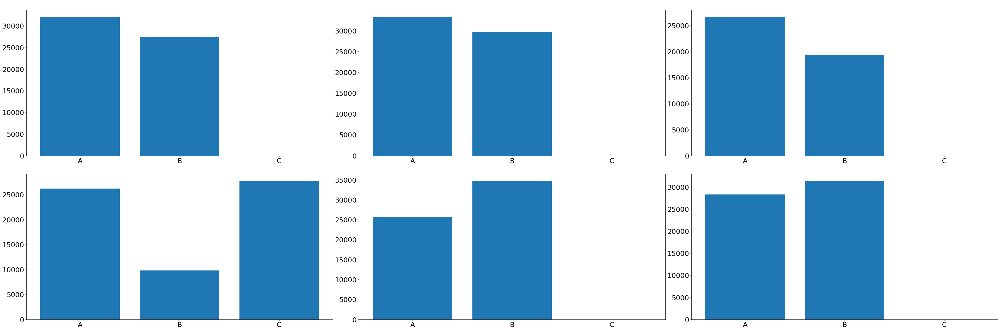

In [9]:
# Find out which plant sites are the favourites
# we can use our map lookup from before?

plant_rates = np.zeros((len(maps), 3)) # if they add a map with 4 sites i probably no longer care about the game enough to do this

# loop through our rounds
for _round in round_plant_data:
    map_idx = maps_dict[_round["map"]]
    site_idx = ord(_round["plant_events"]["plant_side"].lower()) - ord("a")
    plant_rates[map_idx][site_idx] += 1

fig, ax = plt.subplots(2, 3)
fig.tight_layout()

for i in range(2):
    for j in range(3):
        map_no = (i * 3) + j
        ax[i, j].bar(np.arange(3), plant_rates[map_no])
        ax[i, j].set_xticks(np.arange(3))
        ax[i, j].set_xticklabels(["A", "B", "C"])
        ax[i, j].title.set_text(maps[map_no])

plt.show()

Now somehow, I want to make a heatmap of plant locations on each site.  
And with the power of np.histogram2d, this is actually doable!  
The meme of you never having to write any code by yourself in Python really is true.

In [10]:
# split plant locations into x_y
plant_counts = np.zeros((len(maps), 3))
plant_locations = []
for x in range(len(maps)):
    sites = []
    for y in range(3):
        sites.append(np.zeros((2, int(np.sum(plant_rates[x][y])))))
    plant_locations.append(sites)

for _round in round_plant_data:
    map_idx = maps_dict[_round["map"]]
    site_idx = ord(_round["plant_events"]["plant_side"].lower()) - ord("a")
    arr_idx = int(plant_counts[map_idx][site_idx])
    plant_locations[map_idx][site_idx][0][arr_idx] = _round["plant_events"]["plant_location"]["x"]
    plant_locations[map_idx][site_idx][1][arr_idx] = _round["plant_events"]["plant_location"]["y"]
    plant_counts[map_idx][site_idx] += 1

In [11]:
print(np.ptp(plant_locations[0][0][0]))
print(np.ptp(plant_locations[0][0][1]))

1912.0
1199.0


In [12]:
# there are 6 ranks to look at: iron, bronze, silver, gold, plat, diamond-immo-radiant
rank_groups = [
    (3, 6, "iron"),
    (6, 9, "bronze"),
    (9, 12, "silver"),
    (12, 15, "gold"),
    (15, 18, "plat"),
    (18, 30, "diamond+"),
]

def findRankGroup(rank):
    rank_idx = None
    for idx, (minR, maxR, name) in enumerate(rank_groups):
        if minR <= rank and rank < maxR:
            return idx
    raise Exception("Rank out of bounds")

In [13]:
pixel_size = 20
plant_histograms = np.zeros((len(maps), 3), dtype=object)

for x in range(len(maps)):
    for y in range(3):
        if len(plant_locations[x][y][0]) != 0:
            #print(np.ptp(plant_locations[x][y], axis=1))
            plant_histograms[x][y] = np.histogram2d(plant_locations[x][y][0], plant_locations[x][y][1], bins=np.round(np.ptp(plant_locations[x][y], axis=1) / pixel_size).astype(int))
        else:
            plant_histograms[x][y] = None

import matplotlib

matplotlib.rcParams['figure.figsize'] = [30, 400]

fig, ax = plt.subplots(len(maps) * 3)
fig.tight_layout()

for i in range(len(maps)):
    for j in range(3):
        if plant_histograms[i][j] is not None:
            heatmap, xedges, yedges = plant_histograms[i][j]
            ax[(i * 3) + j].imshow(np.log(heatmap), extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]], origin='lower')
            ax[(i * 3) + j].title.set_text(maps[i] + " - " + chr(ord("A") + j) + " site")

# heatmap, xedges, yedges = plant_histograms[0][0]
# plt.imshow(np.log(heatmap).T, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], origin='lower')
plt.savefig("plant_locations_all_ranks.png")
#plt.show()

<ipython-input-13-59bca775b5f4>:23: RuntimeWarning: divide by zero encountered in log
  ax[(i * 3) + j].imshow(np.log(heatmap), extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]], origin='lower')


These are some nice heatmaps, but lets save a heatmap for each rank

In [14]:

ranked_plant_locations = np.full((len(rank_groups), len(maps), 3), 0, dtype=object)
for index in np.ndindex(ranked_plant_locations.shape):
    ranked_plant_locations[index] = [[], []]

for _round in round_plant_data:
    map_idx = maps_dict[_round["map"]]
    site_idx = ord(_round["plant_events"]["plant_side"].lower()) - ord("a")

    rank_idx = findRankGroup(_round["rank"])

    ranked_plant_locations[rank_idx][map_idx][site_idx][0].append(_round["plant_events"]["plant_location"]["x"])
    ranked_plant_locations[rank_idx][map_idx][site_idx][1].append(_round["plant_events"]["plant_location"]["y"])

pixel_size = 20

for idx, (minR, maxR, name) in enumerate(rank_groups):
    plant_locations = ranked_plant_locations[idx]
    plant_histograms = np.zeros((len(maps), 3), dtype=object)
    for x in range(len(maps)):
        for y in range(3):
            if len(plant_locations[x][y][0]) != 0:
                plant_locations[x][y] = np.array(plant_locations[x][y])
                #print(np.ptp(plant_locations[x][y], axis=1))
                plant_histograms[x][y] = np.histogram2d(plant_locations[x][y][0], plant_locations[x][y][1], bins=np.round(np.ptp(plant_locations[x][y], axis=1) / pixel_size).astype(int))
            else:
                plant_histograms[x][y] = None

    import matplotlib
    matplotlib.rcParams['figure.figsize'] = [30, 400]

    fig, ax = plt.subplots(len(maps) * 3)
    fig.tight_layout()

    for i in range(len(maps)):
        for j in range(3):
            if plant_histograms[i][j] is not None:
                heatmap, xedges, yedges = plant_histograms[i][j]
                ax[(i * 3) + j].imshow(np.log(heatmap), extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]], origin='lower')
                ax[(i * 3) + j].title.set_text(maps[i] + " - " + chr(ord("A") + j) + " site")

    plt.savefig("plant_locations_" + name + ".png")

<ipython-input-14-a8539bb0856c>:38: RuntimeWarning: divide by zero encountered in log
  ax[(i * 3) + j].imshow(np.log(heatmap), extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]], origin='lower')


I'm very happy with these results: they're just what I wanted.

Before we step up to the RNN round win challenge, let's see if we can't get some ability cast data by rank.  
To simplify this, we're going to similarly split our players into the same rank groups from before.

We're just going to find average ability casts by agent by rank. There are 4 abilities: to numpy this, we'll just store a (ranks, agents, 4) array of total ability casts and a (ranks, agents, 4) of total datapoints.  
Abilities will obviously be in UI order: C, Q, E, X.

In [15]:
ability_casts = np.zeros((len(rank_groups), len(agents), 4))
ability_datapoints = np.zeros((len(rank_groups), len(agents)))


pathlist = Path("../data/slim_data").glob('*.json')
for path in pathlist:
    # because path is object not string
    pathstr = str(path)
    # read in the data and add the rounds data
    with open(pathstr, 'r', encoding="utf8") as myfile:
        data = json.load(myfile)
        for match in data:
            roundsCount = len(match["rounds"])
            if roundsCount > 0:
                for player in match["players"]["all_players"]:
                    if (player["currenttier"] != 0):
                        # let's add them directly to the data
                        playerRank = findRankGroup(player["currenttier"])

                        try:
                            ability_casts[playerRank][agents_dict[player["character"]]][0] += player["ability_casts"]["c_cast"] / roundsCount
                            ability_casts[playerRank][agents_dict[player["character"]]][1] += player["ability_casts"]["q_cast"] / roundsCount
                            ability_casts[playerRank][agents_dict[player["character"]]][2] += player["ability_casts"]["e_cast"] / roundsCount
                            ability_casts[playerRank][agents_dict[player["character"]]][3] += player["ability_casts"]["x_cast"] / roundsCount
                            ability_datapoints[playerRank][agents_dict[player["character"]]] += 1
                        except Exception:
                            pass

In [16]:
import codecs
ability_data = ability_casts / np.reshape(ability_datapoints, (len(rank_groups), len(agents), 1))
file_path = "./abilitycasts.json" ## your path variable
json.dump(ability_data.tolist(), codecs.open(file_path, 'w', encoding='utf-8'), separators=(',', ':'), sort_keys=True, indent=4) ### this saves the array in .json format

In [17]:
for x in range(len(rank_groups)):
    print(ability_data[x][agents_dict["Jett"]])

[0.58251683 0.44762472 0.4827918  0.10859787]
[0.65724738 0.43123923 0.53430735 0.1242099 ]
[0.70768484 0.42197297 0.57067177 0.1328653 ]
[0.7607303  0.43079311 0.59918794 0.14015994]
[0.74923772 0.43248611 0.61646819 0.14357796]
[0.75287032 0.43004854 0.6340089  0.14304111]


This is just the data I want, but visualising it may be a bit... eh? I'm not really sure how to go about this.

Whatever, we're onto RNN work now. I want to be able to predict which team will win based on player positions

The plan here is to create 6 networks, one for each map.
First, we run maybe 1/2 dense layers on our positional inputs. Then, we use a bidirectional LSTM into a dense and softmax to get our round winning probabilities.

First of all though, we have to normalise, standardise, everythingize our data.  
I probably want to order the points somehow? maybe by y coordinate or something

wait i still need to put in a bomb plant location somehow.
Ideally I would be able to learn a small Dense network to directly input into the state of the LSTM...  

I'm going to try it with initial_state in the call, and if that doesn't work, I'll put it in the end.  
If I get a good enough model, I _might_ try a rank input?  
I don't exactly know how that'll work out though...

In [18]:
# round_plant_data has the goods
# first of all, lets split our data by map
round_plant_data_by_map = np.zeros((len(maps),), dtype=object)
for x in range(len(maps)):
    round_plant_data_by_map[x] = []
for _round in round_plant_data:
    round_plant_data_by_map[maps_dict[_round["map"]]].append(_round)

for x in range(len(maps)):
    print(maps[x] + " " + str(len(round_plant_data_by_map[x])))


Ascent 59468
Bind 62976
Breeze 45935
Haven 63799
Icebox 60462
Split 59762


In [19]:
minmax_coords = np.zeros((len(maps), 2, 2))
minmax_coords[:, :, 0] = np.inf
minmax_coords[:, :, 1] = -np.inf

axes = ["x", "y"]

for map_idx in range(len(maps)):
    for _round in round_plant_data_by_map[map_idx]:
        for locobj in _round["plant_events"]["player_locations_on_plant"]:
            for x in range(2):
                minmax_coords[map_idx][x][0] = min(minmax_coords[map_idx][x][0], locobj["location"][axes[x]])
                minmax_coords[map_idx][x][1] = max(minmax_coords[map_idx][x][1], locobj["location"][axes[x]])

print(minmax_coords)

[[[ -4837.   7507.]
  [-11057.   2157.]]

 [[   135.  16103.]
  [ -7343.   5754.]]

 [[ -1635.  11435.]
  [ -6157.   7155.]]

 [[ -3657.   7356.]
  [-14085.  -1742.]]

 [[ -8257.   3240.]
  [ -5170.   7152.]]

 [[ -3447.   8258.]
  [-10007.    929.]]]


Just putting a pin in this, but everyone says that a map is "CT sided" or "T sided"
_Personally_, I have my doubts on this statement. I think most of the maps are quite balanced. I like Cyanide's "it's a whatever side we're not on sided map" idea. The mechanics in this game allow you to get around the restrictions of most maps.  
Except Breeze. Why do none of the agents work on that map!!!!  
However, it's not my style to make a claim and be done with it. Let's prove some stuff with data.

Anyway, it's time to get onto the numpyification and normalisation

OHHHH i also wanted to do one other thing and i forgot it :(  

In [20]:
# for now we're only going to do one map
# attacking (bomb planting team) will be 0, defending (bomb defusing team) will be 1
import tensorflow as tf
from tensorflow import keras

def minmax_normalise(no, minmax):
    return (no - minmax[0]) / (minmax[1] - minmax[0])

map_idx = 1
normalisation_data = minmax_coords[map_idx]

x_plantLocations = np.zeros((len(round_plant_data_by_map[map_idx]), 2))
x_playerLocations = np.zeros((len(round_plant_data_by_map[map_idx]), 10, 2))
x_playerTeams = np.zeros((len(round_plant_data_by_map[map_idx]), 10, 1)) # -1 if attacking player, 1 if defending
y_winners = np.zeros((len(round_plant_data_by_map[map_idx]),)) # -1 if attacking wins, 1 if defending
for idx, _round in enumerate(round_plant_data_by_map[map_idx]):
    planter = _round["plant_events"]["planted_by"]["team"].lower()

    x_plantLocations[idx][0] = minmax_normalise(_round["plant_events"]["plant_location"]["x"], normalisation_data[0])
    x_plantLocations[idx][1] = minmax_normalise(_round["plant_events"]["plant_location"]["y"], normalisation_data[1])

    player_locs = sorted(_round["plant_events"]["player_locations_on_plant"], key=lambda k: k["location"]["y"])
    for pl_idx, location in enumerate(player_locs):
        # we need to order these by y later
        x_playerLocations[idx][pl_idx][0] = minmax_normalise(location["location"]["x"], normalisation_data[0])
        x_playerLocations[idx][pl_idx][1] = minmax_normalise(location["location"]["y"], normalisation_data[1])
        x_playerTeams[idx][pl_idx][0] = -1 if location["player_team"].lower() == planter else 1

    y_winners[idx] = 0 if _round["winning_team"].lower() == planter else 1

print(x_plantLocations[:2])
print(x_playerLocations[:2])
print(x_playerTeams[:2])
print(y_winners[:2])

[[0.61961423 0.70779568]
 [0.65048848 0.70932275]]
[[[0.70346944 0.02748721]
  [0.62763026 0.25074445]
  [0.55041333 0.2906009 ]
  [0.7939003  0.32747958]
  [0.42015281 0.49866382]
  [0.89604208 0.52775445]
  [0.61961423 0.70779568]
  [0.         0.        ]
  [0.         0.        ]
  [0.         0.        ]]

 [[0.46655812 0.55394365]
  [0.61767285 0.59181492]
  [0.6430987  0.61960754]
  [0.68568387 0.6550355 ]
  [0.65048848 0.70932275]
  [0.69789579 0.80117584]
  [0.54897295 0.91700389]
  [0.36178607 0.93296175]
  [0.         0.        ]
  [0.         0.        ]]]
[[[-1.]
  [ 1.]
  [ 1.]
  [-1.]
  [-1.]
  [ 1.]
  [-1.]
  [ 0.]
  [ 0.]
  [ 0.]]

 [[ 1.]
  [-1.]
  [-1.]
  [ 1.]
  [-1.]
  [ 1.]
  [-1.]
  [ 1.]
  [ 0.]
  [ 0.]]]
[0. 0.]


In [21]:
def makeLSTMmodel():
    plantLocations_input_um = keras.Input(shape=(2,), name="plantLocations")
    playerLocations_input_um = keras.Input(shape=(None, 2), name="playerLocations")
    playerTeams_input_um = keras.Input(shape=(None, 1), name="playerTeams")
    
    mask = keras.layers.Masking()
    plantLocations_input = mask(plantLocations_input_um)
    playerLocations_input = mask(playerLocations_input_um)
    playerTeams_input = mask(playerTeams_input_um)

    denseLayer1 = keras.layers.Dense(8, activation='relu')
    denseLayer2 = keras.layers.Dense(4, activation='relu')

    def locationEncode(x):
        return denseLayer2(denseLayer1(x))

    plant_location_encode = locationEncode(plantLocations_input)
    players_location_encode = locationEncode(playerLocations_input)
    players_and_teams = keras.layers.Concatenate()([players_location_encode, playerTeams_input])

    lstm_size = 64
    lstm_layer = keras.layers.LSTM(lstm_size)(players_and_teams, initial_state=[keras.layers.Dense(lstm_size)(plant_location_encode), keras.layers.Dense(lstm_size)(plant_location_encode)])
    fin2_layer = keras.layers.Dense(16, activation='relu')
    final_layer = keras.layers.Dense(1, activation='sigmoid')(lstm_layer)

    return keras.Model(inputs=[plantLocations_input_um, playerLocations_input_um, playerTeams_input_um], outputs=final_layer)

model = makeLSTMmodel()
keras.utils.plot_model(model, "model.png", show_shapes=True)
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
playerLocations (InputLayer)    [(None, None, 2)]    0                                            
__________________________________________________________________________________________________
playerTeams (InputLayer)        [(None, None, 1)]    0                                            
__________________________________________________________________________________________________
plantLocations (InputLayer)     [(None, 2)]          0                                            
__________________________________________________________________________________________________
masking (Masking)               multiple             0           plantLocations[0][0]             
                                                                 playerLocations[0][0]        

In [22]:
import datetime
from tensorflow.keras.preprocessing.sequence import pad_sequences

# now we can train! :)
datapoints = len(x_plantLocations)
p = np.random.permutation(datapoints)
train_points = int(datapoints * 0.8)

x_plantLocations, x_plantLocations_test = np.split(x_plantLocations[p], [train_points])
x_playerLocations, x_playerLocations_test = np.split(x_playerLocations[p], [train_points])
x_playerTeams, x_playerTeams_test = np.split(x_playerTeams[p], [train_points])
y_winners, y_winners_test = np.split(y_winners[p], [train_points])

model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=[keras.losses.BinaryCrossentropy()],
    metrics=['accuracy']
)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
checkpoint_callback = keras.callbacks.ModelCheckpoint(
        # Path where to save the model
        # The two parameters below mean that we will overwrite
        # the current checkpoint if and only if
        # the `val_loss` score has improved.
        # The saved model name will include the current epoch.
        filepath="./modelsaves/mymodel_{epoch}",
        save_best_only=True,  # Only save a model if `val_loss` has improved.
        monitor="val_loss",
        verbose=1,
    )

model.fit(
    [np.array(x_plantLocations, dtype=np.float), np.array(x_playerLocations, dtype=np.float), np.array(x_playerTeams, dtype=np.float)],
    np.array(y_winners, dtype=np.float),
    epochs=10000,
    batch_size=32,
    validation_data=([x_plantLocations_test, x_playerLocations_test, x_playerTeams_test], y_winners_test),
    callbacks=[tensorboard_callback, checkpoint_callback]
)

Epoch 1/10000
1575/1575 [==============================] - 60s 23ms/step - loss: 0.4258 - accuracy: 0.7983 - val_loss: 0.4103 - val_accuracy: 0.8057

Epoch 00001: val_loss improved from inf to 0.41029, saving model to ./modelsaves\mymodel_1


KeyboardInterrupt: 

In other files, I found the best performing model was AR4 in models.py

However, we don't know if this is actually a good model. If I can outperform it with simple programmatic models, then it goes in the bin :(
    (spoiler alert: it looks like that's where it's going.)
    (if the attacking team already has a 72% winrate, we could literally just guess "attackers win" and do pretty good)

In [23]:
print(np.mean(y_winners_test))

0.2785805017465862


In [24]:
print(x_playerTeams.shape)
win_losses = np.zeros((6, 6, 2))
# y_winners
for idx, datapoint in enumerate(x_playerTeams):
    # count how many attackers and defenders there are
    attackers = int(np.count_nonzero(datapoint == -1))
    defenders = int(np.count_nonzero(datapoint == 1))
    win_losses[attackers][defenders][int(y_winners[idx])] += 1

#print(win_losses)
tot_predictable = 0
for x in range(6):
    for y in range(6):
        tot_predictable += np.amax(win_losses[x][y])
print(tot_predictable)
print(np.sum(win_losses))

(50380, 10, 1)
40573.0
50380.0


Our model is _just_ better on the accuracy metric, which, you know what, is good enough for me. Because I can give smooth accuracies, this is actually better, and makes for a nice web tool.

The last piece of the puzzle is map sidings.

In [28]:
# To do this, we're going to look at all of the round win data.
# We're just going to look at the rate of attackers/defenders winning their rounds on each map.
# Despite all of Riot's extraneous data, they do not seem to like adding which team is attacking for each round.

map_round_winners = np.zeros((len(maps), 2)) # if the attacker wins, [0] incremented otherwise [1] incremented

pathlist = Path("../data/slim_data").glob('*.json')
for path in pathlist:
    # because path is object not string
    pathstr = str(path)
    # read in the data and add the rounds data
    with open(pathstr, 'r', encoding="utf8") as myfile:
        data = json.load(myfile)
        for match in data:
            roundsCount = len(match["rounds"])
            map_idx = maps_dict[match["metadata"]["map"]]
            if roundsCount > 0:
                for idx, _round in enumerate(match["rounds"]):
                    attacker = "red"
                    if idx >= 12:
                        # blue is now attacking
                        attacker = "blue"
                    if _round["winning_team"].lower() == attacker:
                        map_round_winners[map_idx][0] += 1
                    else:
                        map_round_winners[map_idx][1] += 1

[-3.88712404 -2.93572165  2.19936072  1.78919739  2.60489496 -2.78368404]


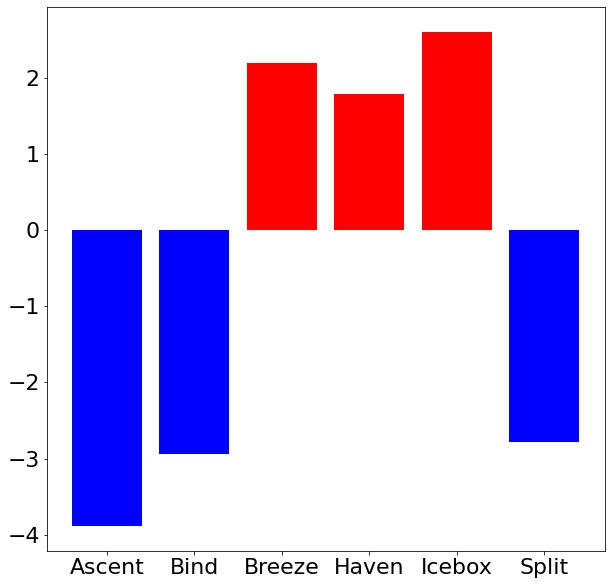

In [31]:
attacker_sided = np.zeros((len(maps),))
for x in range(len(maps)):
    attacker_sided[x] = map_round_winners[x][0] / (map_round_winners[x][0] + map_round_winners[x][1])
attacker_sided -= 0.5
print(attacker_sided * 200)
plt.rcParams["figure.figsize"] = (10, 10)
plt.bar(np.arange(len(maps)), attacker_sided * 200, color=np.where(attacker_sided < 0, 'blue', 'red'), tick_label=maps)
plt.show()

And with that, my research is finally complete!
I'm just gonna train some LSTMs, but... i'll do this later  
for the team composition thing...

let's quickly find out the best pairings of agents

In [48]:
import itertools

# x_agents contains our list of agents
agents_win_loss = np.zeros((len(agents), len(agents), 2))
for x in range(x_agents.shape[0]):
    # we need to go through each pair of agents
    winning = int(y_winning[x])
    picked_agents = np.nonzero(x_agents[x])[0]
    for ag1, ag2 in itertools.combinations(picked_agents, 2):
        agents_win_loss[ag1][ag2][winning] += 1

print(list(np.nonzero(x_agents[0])))
print(y_winning[0])
print(agents_win_loss)

[array([ 2,  4,  5,  8, 13], dtype=int64)]
1.0
[[[   0.    0.]
  [  61.   61.]
  [  33.   31.]
  [ 132.  114.]
  [ 530.  444.]
  [ 212.  214.]
  [  58.   45.]
  [ 191.  142.]
  [ 311.  325.]
  [ 532.  483.]
  [ 635.  583.]
  [ 119.   94.]
  [ 257.  222.]
  [  80.   69.]
  [  89.   69.]]

 [[   0.    0.]
  [   0.    0.]
  [ 293.  260.]
  [ 178.  137.]
  [1023.  904.]
  [ 336.  253.]
  [ 527.  459.]
  [ 370.  277.]
  [ 688.  615.]
  [1049.  980.]
  [1322. 1196.]
  [ 165.  119.]
  [ 338.  313.]
  [ 299.  269.]
  [ 195.  153.]]

 [[   0.    0.]
  [   0.    0.]
  [   0.    0.]
  [ 596.  589.]
  [2333. 2209.]
  [1011.  970.]
  [ 202.  160.]
  [ 820.  729.]
  [1574. 1464.]
  [2439. 2370.]
  [3081. 2982.]
  [ 502.  430.]
  [1103. 1098.]
  [ 373.  305.]
  [ 360.  299.]]

 [[   0.    0.]
  [   0.    0.]
  [   0.    0.]
  [   0.    0.]
  [1832. 1716.]
  [ 277.  240.]
  [1035.  846.]
  [ 615.  571.]
  [1211. 1132.]
  [1892. 1811.]
  [2310. 2214.]
  [ 348.  289.]
  [ 555.  550.]
  [ 452.  449.]
  [

In [49]:
print(np.sum(y_winning)/ y_winning.shape[0])

0.49079222720478327


In [51]:
agentpairings = {}
for key in agents_dict:
    agentpairings[key] = []
for x in range(len(agents)):
    for y in range(x + 1, len(agents), 1):
        agentpairings[agents[x]].append({ "agent": agents[y], "winrate": agents_win_loss[x][y][1] / (agents_win_loss[x][y][1] + agents_win_loss[x][y][0]) })
        agentpairings[agents[y]].append({ "agent": agents[x], "winrate": agents_win_loss[x][y][1] / (agents_win_loss[x][y][1] + agents_win_loss[x][y][0]) })

print(agentpairings)

{'Killjoy': [{'agent': 'Astra', 'winrate': 0.5023474178403756}, {'agent': 'Breach', 'winrate': 0.4295415959252971}, {'agent': 'Brimstone', 'winrate': 0.48965169106511863}, {'agent': 'Cypher', 'winrate': 0.46421663442940037}, {'agent': 'Jett', 'winrate': 0.49908287477071867}, {'agent': 'Omen', 'winrate': 0.4979630209965528}, {'agent': 'Phoenix', 'winrate': 0.48253493013972054}, {'agent': 'Raze', 'winrate': 0.5050855867030514}, {'agent': 'Reyna', 'winrate': 0.5045288415699984}, {'agent': 'Sage', 'winrate': 0.507338056680162}, {'agent': 'Skye', 'winrate': 0.4708333333333333}, {'agent': 'Sova', 'winrate': 0.498846331333641}, {'agent': 'Viper', 'winrate': 0.5016722408026756}, {'agent': 'Yoru', 'winrate': 0.47146401985111663}], 'Viper': [{'agent': 'Astra', 'winrate': 0.46308724832214765}, {'agent': 'Breach', 'winrate': 0.4735915492957746}, {'agent': 'Brimstone', 'winrate': 0.4498525073746313}, {'agent': 'Cypher', 'winrate': 0.4983351831298557}, {'agent': 'Jett', 'winrate': 0.4976030680728667

:)